# 01MIAR - Actividad Dataset
## Python para la Intenigencia Artificial
## Alumno: Rodrigo Javier Buzeta Araya

## Introducción

En la DATATÓN BC se planteó un reto analítico inspirado en procesamiento de lenguaje natural (NLP) para ayudar a los comerciales del Banco para que tengan mayor conocimiento de lo clientes corporativos, a través de la creación de un sistema de recomendación de noticias de los diferentes medios de prensa locales e internacionales.



## Objetivo

Crear un sistema de recomendación de noticias sobre clientes corporativos que le ofrezcan al comercial información relevante, actualizada y confiable.

- Categorización de Noticias
- Recomendación de Noticias

- Aplicar diferentes técnicas de tratamiento de datos explicadas durante el curso
- Explorar datos y evaluarlos mediante el uso de Pandas
- Aplicar adecuadamente técnicas de visualización
- Desarrollar una capacidad crítica y conocer fuentes de información

## Dataset

### 1. Usaremos el dataset “Dataton 2022”

Este dataset proviene de la **Datatón 2022** organizada por el Banco de Colombia y está disponible en Kaggle, obra de **juancamilodiazzapata** ([kaggle.com][1]).

[1]: https://www.kaggle.com/datasets/juancamilodiazzapata/dataton-2022?utm_source=chatgpt.com "Dataton_2022 - Kaggle"

Datos:
#### **clientes.csv**: Archivo con el listado de clientes a consultar, la descripción de su actividad económica y el subsector  
**nit**: Identificador único del cliente  
**nombre**: Nombre corporativo del cliente  
**desc_ciiu_división**: Descripción general de la clasificación Industrial uniforme de todas las actividades económicas  
**desc_ciiu_grupo**: Descripción por grupo de la clasificación Industrial uniforme de todas las actividades económicas  
**desc_ciiu_clase**: : Descripción por clase de la clasificación Industrial uniforme de todas las actividades económicas  
**subsector**: Clasificación de la actividad industrial  

#### **clientes_noticias.csv**: Relación entre cliente y las noticias consultadas mediante el proceso de descarga de información  
**news_id**: Identificador único del cliente  
**news_url_absolute**: url de la noticia encontrada  
**news_init_date**: Fecha mínima del intevalo de tiempo al que pertenece la noticia  
**news_final_date**: Fecha máxima del del intevalo de tiempo al que pertenece la noticia  

#### **noticias.csv**: Contenido de cada una de las noticias consultadas  
**new_id**: Identificador único de noticias  
**news_url_absolute**: Url de la noticia encontrada  
**news_init_date**: Fecha mínima del intevalo de tiempo al que pertenece la noticia  
**news_final_date**: Fecha máxima del del intevalo de tiempo al que pertenece la noticia  
**news_title**: Título relacionado a la noticia  
**news_text_content**: Texto contenido de la noticia  

### Entrega
- Un solo documento en formato notebook: .ipynb. Si el dataset no se obtiene mediante descarga desde el propio notebook, adjuntarlo a la entrega como un archivo comprimido
- Las entregas sólo serán validas si se realizan a través del site de la asignatura: Actividades, Actividad Final

### Evaluación
- Esta actividad corresponde con el 30% de la nota final de la asignatura

### Fecha Entrega
- Convocatoria 1 - 26/07/2025 - 08.00 CEST
- Convocatoria 2 - 27/09/2025 - 08.00 CEST

In [ ]:
# Esto fue usado para descargar directamente el dataset de Kaggle
# Aseguramos de tener instalado kagglehub: pip install kagglehub
# Una vez descargado el dataset, fue copiado junto al notebook
# y luego se eliminó el archivo zip descargado.
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("juancamilodiazzapata/dataton-2022")

# print("Path to dataset files:", path)

In [350]:
# Vamos a proceder a cargar archivos en pandas y a revisar el dataset
import pandas as pd

# Cargar el dataset
clientes = pd.read_csv("clientes.csv")
noticias = pd.read_csv("noticias.csv")
clientes_noticias = pd.read_csv("clientes_noticias.csv")

In [351]:
# Mostraremos los encabezados y primeras filas
print("Clientes DataFrame:")
print(clientes.head())

print("\nNoticias DataFrame:")
print(noticias.head())

print("\nClientes Noticias DataFrame:")
print(clientes_noticias.head())

Clientes DataFrame:
         nit                            nombre  \
0  805027024  SUPERMERCADO LA GRAN COLOMBIA SA   
1  890100026                       CAMAGUEY SA   
2  801004045                     DON POLLO SAS   
3  900319372                   RED CARNICA SAS   
4  800198020             CARNES CASABLANCA S A   

                      desc_ciiu_division  \
0  ELABORACION DE PRODUCTOS ALIMENTICIOS   
1  ELABORACION DE PRODUCTOS ALIMENTICIOS   
2  ELABORACION DE PRODUCTOS ALIMENTICIOS   
3  ELABORACION DE PRODUCTOS ALIMENTICIOS   
4  ELABORACION DE PRODUCTOS ALIMENTICIOS   

                                     desc_ciuu_grupo  \
0  PROCESAMIENTO Y CONSERVACION DE CARNE, PESCADO...   
1  PROCESAMIENTO Y CONSERVACION DE CARNE, PESCADO...   
2  PROCESAMIENTO Y CONSERVACION DE CARNE, PESCADO...   
3  PROCESAMIENTO Y CONSERVACION DE CARNE, PESCADO...   
4  PROCESAMIENTO Y CONSERVACION DE CARNE, PESCADO...   

                                    desc_ciiuu_clase        subsec  
0  PROCE

In [352]:
print("Vamos a proceder a revisar clientes")
# Vamos a ver dimensiones y columnas
print(clientes.shape, clientes.columns)
# Ver tipos y valores nulos
print(clientes.info())


Vamos a proceder a revisar clientes
(1507, 6) Index(['nit', 'nombre', 'desc_ciiu_division', 'desc_ciuu_grupo',
       'desc_ciiuu_clase', 'subsec'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1507 entries, 0 to 1506
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   nit                 1507 non-null   int64 
 1   nombre              1507 non-null   object
 2   desc_ciiu_division  1507 non-null   object
 3   desc_ciuu_grupo     1507 non-null   object
 4   desc_ciiuu_clase    1507 non-null   object
 5   subsec              1507 non-null   object
dtypes: int64(1), object(5)
memory usage: 70.8+ KB
None


In [353]:
# Los datos, en general están en buenas condiciones, no hay valores nulos
# Sin embargo, los nombres de algunos campos parecen estar mal escritos o tener errores tipográficos.
# En Colombia existe el código CIIU (Clasificación Industrial Internacional Uniforme) que se usa para clasificar actividades económicas.
# En este caso, los nombres de las columnas relacionadas con CIIU parecen tener errores:
# desc_ciuu_grupo debería ser desc_ciiu_grupo
# desc_ciuu_subgrupo debería ser desc_ciiu_subgrupo
# Vamos a proceder a ajustar los nombres de las columnas
clientes.rename(columns={
    "desc_ciuu_grupo": "desc_ciiu_grupo",
    "desc_ciuu_subgrupo": "desc_ciiu_subgrupo",
    "desc_ciiuu_clase": "desc_ciiu_clase"
}, inplace=True)


In [354]:
print("Vamos a proceder a revisar noticias")
# Vamos a ver dimensiones y columnas
print(noticias.shape, noticias.columns)
# Ver tipos y valores nulos
print(noticias.info())
# Los datos, en general están en buenas condiciones, no hay valores nulos

Vamos a proceder a revisar noticias
(23377, 6) Index(['news_id', 'news_url_absolute', 'news_init_date', 'news_final_date',
       'news_title', 'news_text_content'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23377 entries, 0 to 23376
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   news_id            23377 non-null  object
 1   news_url_absolute  23377 non-null  object
 2   news_init_date     23377 non-null  object
 3   news_final_date    23377 non-null  object
 4   news_title         23377 non-null  object
 5   news_text_content  23377 non-null  object
dtypes: object(6)
memory usage: 1.1+ MB
None


In [355]:
print("Vamos a proceder a revisar clientes_noticias")
# Vamos a ver dimensiones y columnas
print(clientes_noticias.shape, clientes_noticias.columns)
# Ver tipos y valores nulos
print(clientes_noticias.info())
# Los datos, en general están en buenas condiciones, no hay valores nulos

Vamos a proceder a revisar clientes_noticias
(74709, 5) Index(['nit', 'news_id', 'news_url_absolute', 'news_init_date',
       'news_final_date'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74709 entries, 0 to 74708
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   nit                74709 non-null  int64 
 1   news_id            74709 non-null  object
 2   news_url_absolute  74709 non-null  object
 3   news_init_date     74709 non-null  object
 4   news_final_date    74709 non-null  object
dtypes: int64(1), object(4)
memory usage: 2.9+ MB
None


In [356]:
print("Estadísticas de 'clientes.csv'")

# Distribución por división CIIU
print("\n- Top divisiones CIIU:")
print(clientes['desc_ciiu_division'].value_counts().head(10))

# Distribución por grupo CIIU
print("\n- Top grupos CIIU:")
print(clientes['desc_ciiu_grupo'].value_counts().head(10))

# Distribución por clase CIIU
print("\n- Top clases CIIU:")
print(clientes['desc_ciiu_clase'].value_counts().head(10))

# Número de sectores únicos
print(f"\n- Sectores únicos (subsec): {clientes['subsec'].nunique()}")

# Empresas por subsector
print("\n- Clientes por subsector (top 10):")
print(clientes['subsec'].value_counts().head(10))

Estadísticas de 'clientes.csv'

- Top divisiones CIIU:
desc_ciiu_division
COMERCIO AL POR MAYOR Y EN COMISION O POR CONTRATA, EXCEPTO EL COMERCIO DE VEHICULOS AUTOMOTORES Y MOTOCICLETAS                 163
CONSTRUCCION DE EDIFICIOS                                                                                                       111
ACTIVIDADES DE SERVICIOS FINANCIEROS, EXCEPTO LAS DE SEGUROS Y DE PENSIONES                                                     107
ELABORACION DE PRODUCTOS ALIMENTICIOS                                                                                            79
COMERCIO AL POR MENOR (INCLUSO EL COMERCIO AL POR MENOR DE COMBUSTIBLES), EXCEPTO EL DE VEHICULOS AUTOMOTORES Y MOTOCICLETAS     76
ACTIVIDADES AUXILIARES DE LAS ACTIVIDADES DE SERVICIOS FINANCIEROS                                                               71
COMERCIO, MANTENIMIENTO Y REPARACION DE VEHICULOS AUTOMOTORES Y MOTOCICLETAS, SUS PARTES, PIEZAS Y ACCESORIOS                    59
OB

In [357]:
print("Estadísticas de 'noticias.csv'")

# Longitud del título y del texto
noticias['text_length'] = noticias['news_text_content'].apply(len)
noticias['title_length'] = noticias['news_title'].apply(len)

# Estadísticas descriptivas
print("\n- Longitud del contenido de la noticia:")
print(noticias['text_length'].mean())

print("\n- Longitud del título de la noticia:")
print(noticias['title_length'].mean())

# Distribución por año (si las fechas tienen formato adecuado)
noticias['news_init_date'] = pd.to_datetime(noticias['news_init_date'])
print("\n- Noticias por año:")
print(noticias['news_init_date'].dt.year.value_counts())

# Nos damos cuenta de que sólo hay noticias del año 2022

Estadísticas de 'noticias.csv'

- Longitud del contenido de la noticia:
4215.613936775463

- Longitud del título de la noticia:
67.90383710484664

- Noticias por año:
news_init_date
2022    23377
Name: count, dtype: int64


In [358]:
print("Estadísticas de 'clientes_noticias.csv'")

# Noticias más leídas (top 10)
print("\n- Noticias más leídas:")
print(clientes_noticias['news_id'].value_counts().head(10))

# Clientes más activos (top 10)
print("\n- Clientes que más noticias han leído:")
print(clientes_noticias['nit'].value_counts().head(10))

# Clientes que leyeron menos noticias (bottom 10)
print("\n- Clientes que menos noticias han leído:")
print(clientes_noticias['nit'].value_counts().tail(10))

# Promedio de noticias por cliente
noticias_por_cliente = clientes_noticias.groupby('nit')['news_id'].count()
print("\n- Estadísticas de noticias leídas por cliente:")
print(noticias_por_cliente.mean())

# Promedio de clientes por noticia
clientes_por_noticia = clientes_noticias.groupby('news_id')['nit'].count()
print("\n- Estadísticas de clientes que leyeron cada noticia:")
print(clientes_por_noticia.mean())


Estadísticas de 'clientes_noticias.csv'

- Noticias más leídas:
news_id
news14869    278
news95826    247
news30081    226
news95851    206
news95854    192
news36967    180
news27814    175
news32180    170
news13692    167
news49545    167
Name: count, dtype: int64

- Clientes que más noticias han leído:
nit
900378212    187
860522747    184
860007627    182
900628110    174
900232067    169
900883552    169
860001022    168
860005216    168
860028971    165
901212102    161
Name: count, dtype: int64

- Clientes que menos noticias han leído:
nit
890905032    10
890800718     9
860000996     9
860026753     7
800080917     6
900710164     4
817000790     4
890906752     4
800227924     4
890807976     4
Name: count, dtype: int64

- Estadísticas de noticias leídas por cliente:
49.541777188328915

- Estadísticas de clientes que leyeron cada noticia:
3.1958335115712027


In [359]:
# Vamos a extraer un pequeño set de noticias para hacer el análisis de las palabras que usaremos como firma
# Hay más de 20.000

noticias_para_analisis = noticias[0:9999]

print(noticias_para_analisis.count())
print(noticias_para_analisis.head(10))

news_id              9999
news_url_absolute    9999
news_init_date       9999
news_final_date      9999
news_title           9999
news_text_content    9999
text_length          9999
title_length         9999
dtype: int64
     news_id                                  news_url_absolute  \
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
1  news10011  https://www.semana.com/economia/macroeconomia/...   
2  news10015  https://elcomercio.pe/respuestas/que/gustavo-p...   
3  news10028  https://www.lanacion.com.ar/estados-unidos/cua...   
4  news10029  https://www.lanacion.com.ar/estados-unidos/com...   
5  news10030  https://www.semana.com/economia/macroeconomia/...   
6  news10031  https://www.lanacion.com.ar/estados-unidos/cua...   
7  news10033  https://expansion.mx/unicorn-hunters/2022/08/0...   
8  news10044  https://www.bloomberglinea.com/2022/08/02/citi...   
9  news10057  https://www.bbva.com/es/es/sostenibilidad/opde...   

  news_init_date news_final_date  \
0    

In [360]:
# Vamos a hacer un análisis de palabras clave en las noticias con pandas

print("Análisis de palabras clave en las noticias")

def clean_text(text):
    return ''.join(c for c in text if c.isalpha() or c.isspace()).lower()

# Contamos las palabras más comunes en el texto de las noticias
noticias_para_analisis['words_list'] = noticias_para_analisis['news_text_content'].str.lower().apply(clean_text).str.split()
# print(noticias['words_list'].head())

palabras_noticias = noticias_para_analisis.explode('words_list')

frecuencia_palabras_noticias = palabras_noticias['words_list'].value_counts()

print("\n- Top palabras clave en las noticias:")
print(frecuencia_palabras_noticias.head(10))


Análisis de palabras clave en las noticias


C:\Users\rodri\AppData\Local\Temp\ipykernel_21312\328289272.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  noticias_para_analisis['words_list'] = noticias_para_analisis['news_text_content'].str.lower().apply(clean_text).str.split()



- Top palabras clave en las noticias:
words_list
de     481976
la     269123
el     203578
en     198333
y      190040
que    179490
a      129844
los    103761
del     89725
las     77046
Name: count, dtype: int64


Total de palabras clave en las noticias: 114347


<BarContainer object of 100 artists>

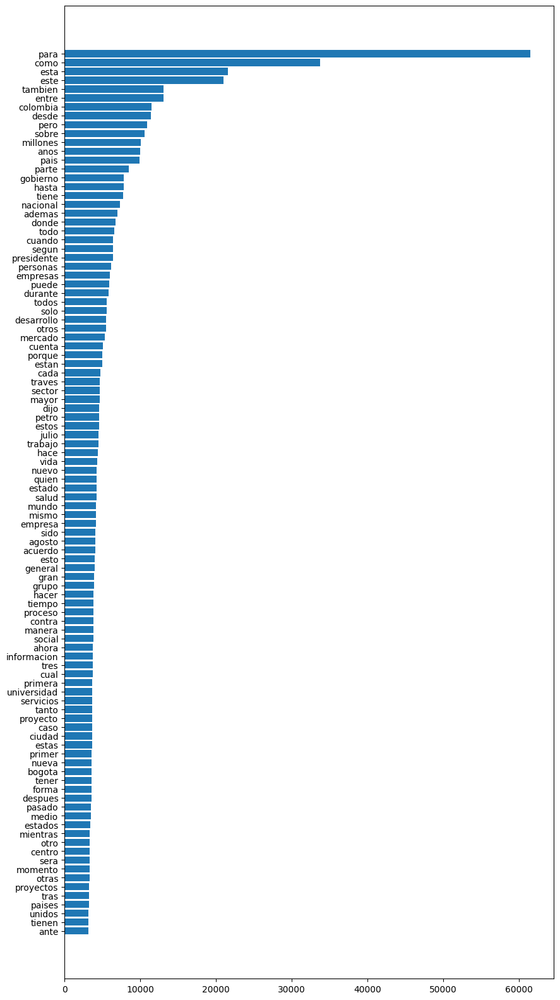

In [361]:
# Resulta evidente que artículos, conjunciones, etc. son las más comunes.
# Comenzaremos por filtar las palabras cortas o excesivamente largas

palabras_limpias = palabras_noticias[
    palabras_noticias['words_list'].str.isalpha() & 
    palabras_noticias['words_list'].str.len().between(4, 20)
]

# Vamos a hacer una gráfica para ver la distribución de las palabras clave

import matplotlib.pyplot as plt


print("Total de palabras clave en las noticias:", palabras_limpias['words_list'].nunique())

plt.figure(figsize=(10, 20))
plt.barh(palabras_limpias['words_list'].value_counts().head(100).index[::-1],
         palabras_limpias['words_list'].value_counts().head(100).values[::-1])



In [362]:
# Estamos buscando palabras que sean indicativo de un tema, para clasificar
# Vamos a limpiar todas aquellas palabras que aparecen más de 3.000 veces (como "para") y todas las que aparecen menos de 50 veces
# Las primeras porque no aportan selectividad y las segundas porque no tienen generalidad (no serían aplicables a un algoritmo)

# Lo primero es generar una tabla de frecuencias
frecuencias = palabras_limpias['words_list'].value_counts().reset_index()

frecuencias = frecuencias[ (frecuencias['count'] < 3000) & (frecuencias['count'] > 50) ]

print(frecuencias.head(10))
print(frecuencias.tail(10))


    words_list  count
102      habia   2991
103    sistema   2969
104       bien   2963
105  seguridad   2956
106      luego   2952
107       dias   2952
108      nivel   2946
109     cambio   2942
110   politica   2924
111     frente   2912
        words_list  count
8834         masas     51
8835          luiz     51
8836  suscriptores     51
8837     partiendo     51
8838      angelica     51
8839        motors     51
8840        saldra     51
8841   frecuencias     51
8842       obedece     51
8843      contaban     51


In [363]:
# Ahora vamos a filtar una tabla de news que contiene palabras de modo que sólo tenga filas con las palabras que interesan

palabras_limpias = palabras_limpias[ palabras_limpias['words_list'].isin(frecuencias['words_list'])]

print(palabras_limpias.count())
print(palabras_limpias.head(10))

news_id              2355651
news_url_absolute    2355651
news_init_date       2355651
news_final_date      2355651
news_title           2355651
news_text_content    2355651
text_length          2355651
title_length         2355651
words_list           2355651
dtype: int64
     news_id                                  news_url_absolute  \
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-dolar...   
0  news10006  https://www.bluradio.com/economia/precio-d

In [364]:
# Vamos a hacer un join entre clientes y noticias para ver qué clientes leyeron qué noticias
clientes_noticias_full = pd.merge(clientes_noticias, clientes, on='nit', how='inner')

# Hemos detectado que hay sectores que (posiblemente por el número de clientes) tienen muy pocas noticias leídas
# Eso tiene como consecuencia una pobre firma de palabras clave
# Por ello, vamos a filtrar aquellos sectores que tienen muy pocas noticias leídas
subsectores_con_noticias = clientes_noticias_full.groupby('subsec').size().reset_index(name='count')
subsectores_con_noticias = subsectores_con_noticias.sort_values(by='count', ascending=False)
print("\n- Subsectores con pocas noticias leídas:")
print(subsectores_con_noticias.tail(20))

# Vamos a filtrar los subsectores que tienen menos de 200 noticias leídas
clientes_filtrados = clientes_noticias_full[clientes_noticias_full['subsec'].isin(subsectores_con_noticias[subsectores_con_noticias['count'] >= 200]['subsec'])]

clientes_noticias_full = pd.merge(clientes_filtrados, palabras_limpias, on='news_id', how='inner')

print("\n- Join entre clientes y noticias:")
print(clientes_noticias_full.head())


- Subsectores con pocas noticias leídas:
                     subsec  count
12                    CACAO    201
4                      ASEO    187
35     EXTRACCION DE CARBON    173
11   BEBIDAS NO ALCOHOLICAS    164
59           PALMA AFRICANA    164
8                    BANANO    151
69       REPUESTOS Y CAUCHO    145
10      BEBIDAS ALCOHOLICAS    139
82                   VIDRIO    139
48         MADERA Y MUEBLES    139
3                     ARROZ    121
27               CONFITERIA    117
67      PRODUCTOS METALICOS    113
63      PINTURAS Y BARNICES    111
75                   TABACO    105
39                   FLORES    104
14  CALZADO Y MARROQUINERIA     97
70        RESINAS PLASTICAS     80
18         COMERCIO DE CAFE     31
62             PESCA Y ATUN     29

- Join entre clientes y noticias:
         nit    news_id                                news_url_absolute_x  \
0  900378212  news10006  https://www.bluradio.com/economia/precio-dolar...   
1  900378212  news10006  https:/

subsec               405937
words_list           405937
frecuencia_sector    405937
dtype: int64
                       subsec      words_list  frecuencia_sector
0  ACUEDUCTO Y ALCANTARILLADO          abadia                  4
1  ACUEDUCTO Y ALCANTARILLADO           abajo                  4
2  ACUEDUCTO Y ALCANTARILLADO      abandonado                  7
3  ACUEDUCTO Y ALCANTARILLADO       abandonar                  3
4  ACUEDUCTO Y ALCANTARILLADO        abandono                  8
5  ACUEDUCTO Y ALCANTARILLADO          abarca                 10
6  ACUEDUCTO Y ALCANTARILLADO         abarcan                  3
7  ACUEDUCTO Y ALCANTARILLADO       abastecer                 17
8  ACUEDUCTO Y ALCANTARILLADO  abastecimiento                 25
9  ACUEDUCTO Y ALCANTARILLADO            abel                  1
words_list          8742
frecuencia_total    8742
dtype: int64
     words_list  frecuencia_total
0         euros            322364
1        espana            172484
2  trabajadores        

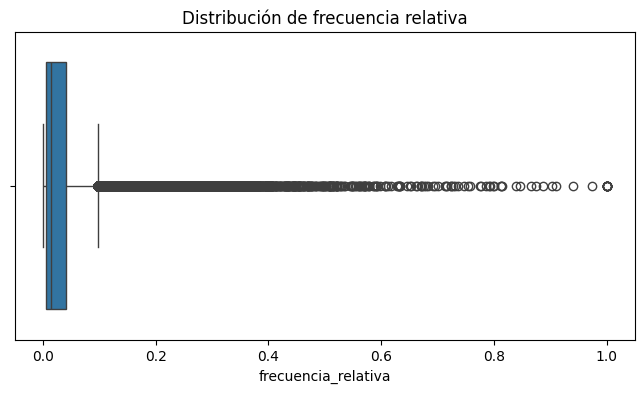

In [366]:
# Vamos a obtener la frecuencia de palabras por subsec y la frecuencia de las palabras en general

frecuencia_por_sector = clientes_noticias_full.groupby(['subsec', 'words_list']).size().reset_index(name='frecuencia_sector')
print(frecuencia_por_sector.count())
print(frecuencia_por_sector.head(10))

frecuencia_total = clientes_noticias_full['words_list'].value_counts().reset_index(name='frecuencia_total')
print(frecuencia_total.count())
print(frecuencia_total.head(10))

firma = frecuencia_por_sector.merge(frecuencia_total, on='words_list')

firma['frecuencia_relativa'] = firma['frecuencia_sector'] / firma['frecuencia_total']

# Vamos a filtrar por aquellas palabras que tienen una frecuencia en el sector mayor que 5 porque de nada sirven muy específicas que rara vez aparecen

firma = firma[ firma['frecuencia_sector'] > 5 ]

import seaborn as sns
plt.figure(figsize=(8,4))
sns.boxplot(x=firma['frecuencia_relativa'])
plt.title("Distribución de frecuencia relativa")
plt.show()


In [367]:
# Vamos a considerar outliers a frecuencia relativa por debajo de 0.02 o mayor que 0.95

firma = firma[(firma['frecuencia_relativa'] >= 0.02) & (firma['frecuencia_relativa'] <= 0.95)]

firma=firma.sort_values(by=['subsec', 'frecuencia_relativa'], ascending=[False,False])

firma = firma.groupby('subsec')['words_list'].apply(lambda x: list(x)).reset_index(name='top_palabras')

firma['top_palabras'] = firma['top_palabras'].apply(lambda x: x[:100])

firma=firma.sort_values(by='subsec', ascending=False)






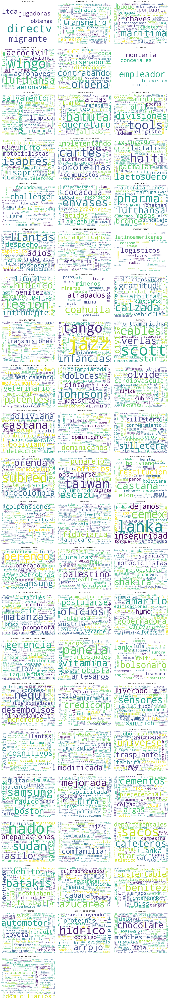

In [368]:
# Vamos a hacer gráficas por subsector con las palabras más relevantes
# Usaremos WordCloud para generar nubes de palabras
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def ponderar_por_posicion(lista):
    return {pal: 1 / (i + 1) for i, pal in enumerate(lista)}

sectores = firma['subsec'].unique()
n_cols = 3
n_rows = (len(sectores) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))

for i, sector in enumerate(sectores):
    ax = axes.flat[i]
    
    palabras = firma[firma['subsec'] == sector]['top_palabras'].values[0]
    freqs = ponderar_por_posicion(palabras)
    
    nube = WordCloud(width=400, height=300, background_color='white').generate_from_frequencies(freqs)
    
    ax.imshow(nube, interpolation='bilinear')
    ax.set_title(sector, fontsize=9)
    ax.axis('off')

for j in range(i+1, n_rows*n_cols):
    fig.delaxes(axes.flat[j])

plt.tight_layout()
plt.show()


In [ ]:
# El resultado no es perfecto pero hay que tener en cuenta que fue el resultado de la visualización de noticias (la gente lee lo que quiere leer)
# Es ingenuo suponer que la gente sólo ve noticias de su área de negocios
# Podría ser cierto que en ciertas áreas de negocio no se vean noticias y en otras el interés esté en otras áreas distintas de la propia

# Vamos a proceder a establecer el algoritmo de clasificación
def limpiar_texto_simple(texto):
    texto = texto.lower()
    return set(''.join(c if c.isalpha() or c.isspace() else ' ' for c in texto).split())


def puntuar_articulo(texto):
    palabras_articulo = limpiar_texto_simple(texto)
    longitud_articulo = len(palabras_articulo)
    scores = {}
    # print(palabras_articulo)
    # print("longitud_articulo", longitud_articulo)


    for _, sector in firma.iterrows():
        total = len(sector['top_palabras'])
        # print("total", total)
        encontradas = sum(1 for kw in sector['top_palabras'] if kw in palabras_articulo)
        scores[sector['subsec']] = encontradas / longitud_articulo / total if (longitud_articulo > 0) and (total > 0) else 0.0

    return scores



# Como ejemplo, haremos la recomendación de artículos según contenido a clientes de cierto sector
# Esto NO significa que la noticia sea del sector sino que LE IMPORTA a clientes del sector
# Esta relación es así porque las categorías fueron identificadas con ese criterio (Quién leyó qué noticia)
# Los datos no nos expresan si la noticia habla de su sector
# Los datos nos expresan si fue leída por alguien del sector
# Por ello, la función nos ayuda a determinar a quién interesa
#
# Una noticia de lluvias interesa mucho al sector de cacao
# Monitoreo de clima parece interesar al sector agroquímico, tal vez por el agro
# Los de sector de hoteles parecen también interesados en la seguridad
# La actividad minera parece estar interesada en problemas de deforestación y sostenibilidad (¿responsabilidad?) y energía
#
for i in range(11000, 11025):
    texto = noticias.iloc[i]['news_text_content']
    scores = puntuar_articulo(texto)
    sector, score = max(scores.items(), key=lambda x: x[1])
    if score <= 0.00000000001:
        sector = "OTRO"
    print(f"Artículo {i}: Titular: {noticias.iloc[i]['news_title']}, Sector: {sector}, Score: {score:.8f}")
    # print(scores)




Artículo 11000: Titular: Ungrd dice que temporada de lluvias se mantendria en lo que resta del ano, Sector: CACAO, Score: 0.00016493
Artículo 11001: Titular: Entregan ocho nuevas estaciones para monitorear el clima en ..., Sector: SERVICIOS A EMPRESAS, Score: 0.00021277
Artículo 11002: Titular: Bogota tendra una manana de tiempo seco este viernes 29 de ..., Sector: COMERCIO DE QUIMICOS Y AGROQUIMICOS, Score: 0.00027027
Artículo 11003: Titular: Pronostico del clima en Bogota para este lunes 25 de julio, Sector: CONFECCIONES, Score: 0.00028604
Artículo 11004: Titular: Trata de personas en Cartagena: EE.UU cuestiono papel de Fiscalia y Policia, Sector: HOTELES, Score: 0.00019279
Artículo 11005: Titular: La deforestacion en Colombia sigue aumentando. ?Que errores se estan repitiendo?, Sector: SERVICIOS A EMPRESAS, Score: 0.00010204
Artículo 11006: Titular: Bogota tendra nuevamente una manana de tiempo seco este ..., Sector: COMERCIO DE QUIMICOS Y AGROQUIMICOS, Score: 0.00021505
Artículo 11

## Conclusiones
- El interés de ciertos sectores parece estar relacionado con su propia actividad. 
- En algunos casos, las palabras clave de las noticias que ciertos sectores leen, pueden predecir el interés futuro.
- Hay algunos sectores donde las palabras clave no parecen tener una lógica coherente, como si leyeran cualquier noticia ¿ruido?
- Sin embargo, se puede concluír que es posible desprender una "firma" como conjuntos de 100 o menos palabras que caracterizan sectores.
- Se puede usar esa "firma" como un "vector" que sirva para establecer una cercanía de un artículo con un sector.
- Finalmente, es posible ofrecer noticias a ciertos sectores que podrían considerar que el medio ofrece noticias de su interés.